# Biki Rewind 2023-2024

## Setup

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as cx

In [19]:
df = pd.read_csv("history.csv", parse_dates=["INICIO", "FIN"])
stations_location = pd.read_csv("stations.csv")
df

,TIPO,NUMERO,INICIO,FIN,ORIGEN,DESTINO
0,Eléctrica,5348,2023-02-01 18:21:00,2023-02-01 18:50:00,202,208
1,Eléctrica,5335,2023-02-03 17:43:00,2023-02-03 18:03:00,204,803
2,Eléctrica,5210,2023-02-03 18:51:00,2023-02-03 19:09:00,803,809
3,Eléctrica,5335,2023-02-03 20:05:00,2023-02-03 20:30:00,803,11
4,Mecánica,20,2023-02-07 16:27:00,2023-02-07 17:02:00,505,208
5,Eléctrica,5150,2023-02-10 22:41:00,2023-02-10 22:55:00,204,204
6,Eléctrica,5228,2023-02-14 17:48:00,2023-02-14 18:12:00,204,803
7,Eléctrica,5217,2023-02-14 19:58:00,2023-02-14 20:17:00,803,204
8,Mecánica,522,2023-03-11 20:31:00,2023-03-11 20:48:00,11,602
9,Eléctrica,5263,2023-03-11 23:56:00,2023-03-12 00:07:00,9,203


# Bicicletas

## Usos totales

In [3]:
df["TIPO"].count()

50

## ¿Mecánicas vs Eléctricas?

In [4]:
a = df.groupby(df["TIPO"]).count()["NUMERO"]

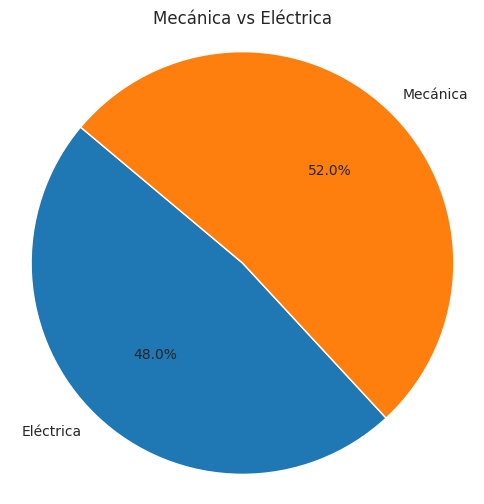

In [5]:
sns.set_style("whitegrid")
plt.figure(figsize=(6,6))
plt.pie(a.values, labels=a.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title("Mecánica vs Eléctrica")
plt.show()

## Bicicletas usadas

In [6]:
a = df.groupby(["NUMERO", "TIPO"], as_index=False).agg(count=("NUMERO", "count"))
a["NUMERO"] = a["NUMERO"].astype(str)

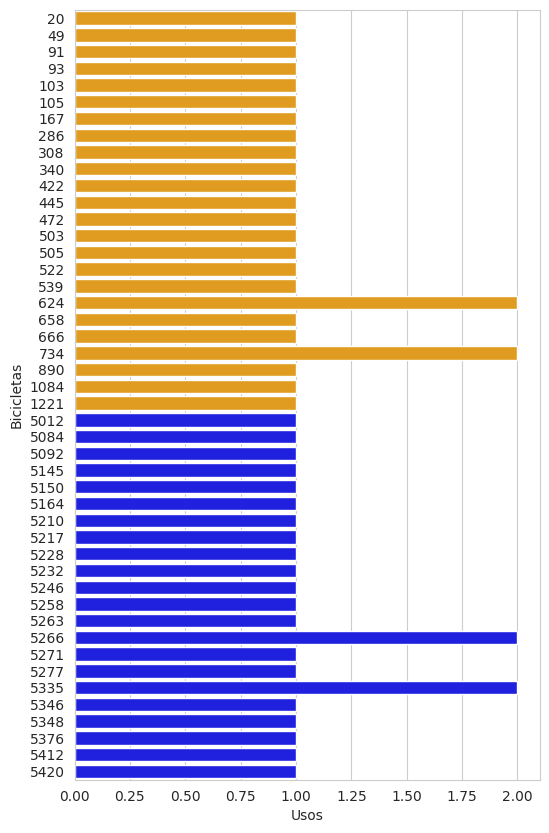

In [7]:
plt.figure(figsize=(6, 10))
palette = {"Mecánica": "orange", "Eléctrica": "blue"}
sns.barplot(y="NUMERO", x="count", hue="TIPO", data=a, dodge=False, palette=palette)
plt.xlabel("Usos")
plt.ylabel("Bicicletas")
plt.legend().remove()

# Viajes

## Tiempos

In [8]:
df["duration"] = df["FIN"] - df["INICIO"]

In [9]:
# Viaje más corto
df.loc[df["duration"] == df["duration"].min()]

,TIPO,NUMERO,INICIO,FIN,ORIGEN,DESTINO,duration
49,Mecánica,1084,2024-02-03 07:51:00,2024-02-03 08:00:00,201,301,0 days 00:09:00


In [10]:
# Viaje más largo
df.loc[df["duration"] == df["duration"].max()]

,TIPO,NUMERO,INICIO,FIN,ORIGEN,DESTINO,duration
4,Mecánica,20,2023-02-07 16:27:00,2023-02-07 17:02:00,505,208,0 days 00:35:00


In [11]:
# Tiempo de viaje medio por tipo de bicicleta
df.groupby("TIPO").agg(mean_time=("duration", "mean"))

,mean_time
TIPO,
Eléctrica,0 days 00:19:30
Mecánica,0 days 00:17:25.384615384


In [12]:
# Tiempo usando BIKI
df["duration"].sum()

Timedelta('0 days 15:21:00')

# Estaciones

# Estaciones más populares

In [13]:
stations = pd.concat([df["ORIGEN"], df["DESTINO"]], ignore_index=True)
stations = pd.DataFrame({"ID": stations})
stations = stations.groupby("ID", as_index=False).agg(count=("ID", "count"))
stations.sort_values(by="count", ascending=False)

,ID,count
9,204,25
18,803,21
6,201,13
2,8,3
3,9,3
4,11,3
5,13,3
7,202,3
17,602,3
0,3,2


In [29]:
stations_data = pd.merge(stations_location, stations, on="ID", how="left")
gdf = gpd.GeoDataFrame(stations_data, geometry=gpd.points_from_xy(stations_data["LON"], stations_data["LAT"]))
gdf.crs = "EPSG:4326"
gdf["geometry"] = gdf["geometry"].buffer(0.0005+0.0001*gdf["count"])
gdf

/tmp/ipykernel_3650/3197351322.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["geometry"] = gdf["geometry"].buffer(0.0005+0.0001*gdf["count"])


,ID,NAME,LAT,LON,count,geometry
0,201,Centro Cívico Esgueva,41.659010,-4.714940,13,"POLYGON ((-4.71314 41.65901, -4.71315 41.65883..."
1,301,Centro Cívico Zona Este,41.644920,-4.711340,1,"POLYGON ((-4.71074 41.64492, -4.71074 41.64486..."
2,204,Colegio Entre Ríos,41.663875,-4.721084,25,"POLYGON ((-4.71808 41.66388, -4.71810 41.66358..."
3,803,Calle Profesor Adolfo Miaja de la Muela,41.635492,-4.755048,21,"POLYGON ((-4.75245 41.63549, -4.75246 41.63524..."
4,11,Facultad de Medicina,41.654540,-4.716341,3,"POLYGON ((-4.71554 41.65454, -4.71554 41.65446..."
5,902,Feria de Muestras,41.656517,-4.737466,1,"POLYGON ((-4.73687 41.65652, -4.73687 41.65646..."
6,810,Piscina Municipal Parquesol,41.641079,-4.757267,1,"POLYGON ((-4.75667 41.64108, -4.75667 41.64102..."
7,202,Campus Miguel Delibes,41.661647,-4.707879,3,"POLYGON ((-4.70708 41.66165, -4.70708 41.66157..."
8,206,Calle Portillo de Balboa,41.660710,-4.721098,1,"POLYGON ((-4.72050 41.66071, -4.72050 41.66065..."
9,3,Estación de Tren,41.643224,-4.726620,2,"POLYGON ((-4.72592 41.64322, -4.72592 41.64316..."


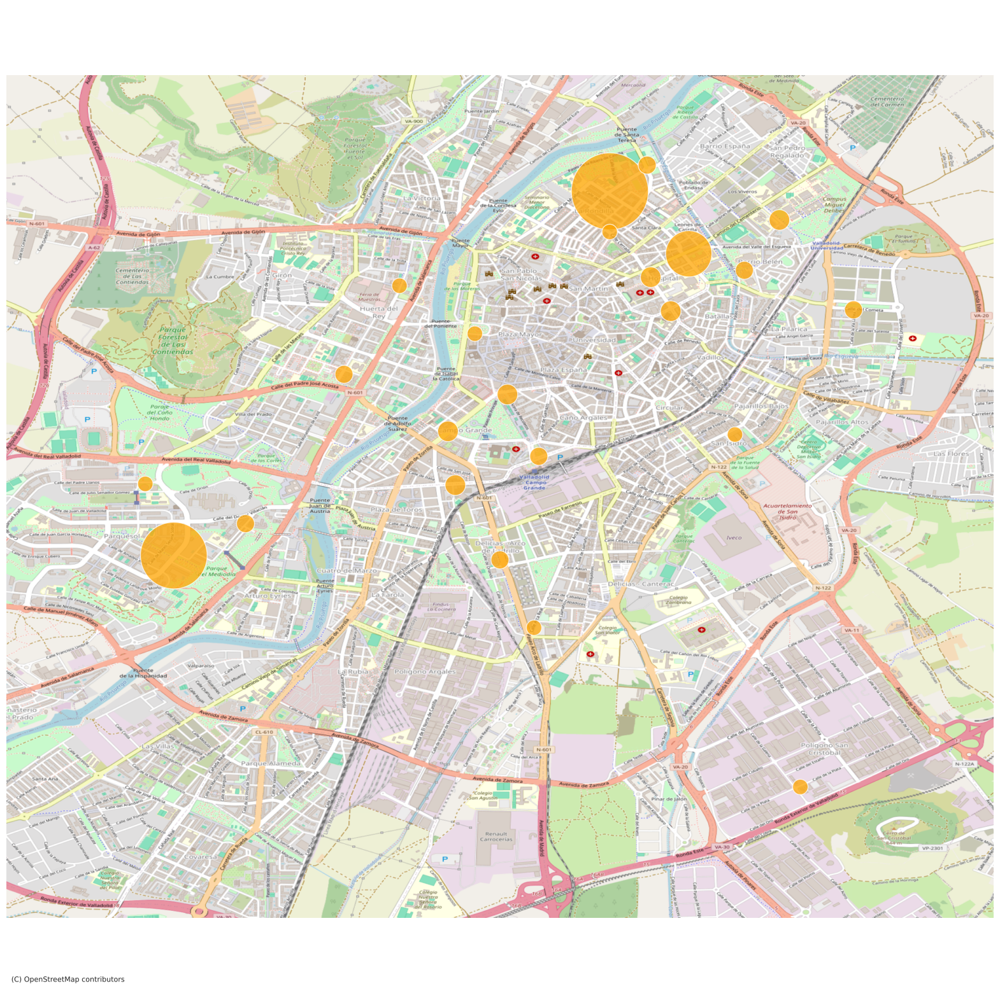

In [36]:
ax = gdf.plot(figsize=(20, 20), color="orange", alpha=0.75)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik, zoom=15)
ax.set_axis_off()
plt.axis('equal')
plt.savefig("BikiRewind.png")
plt.show()

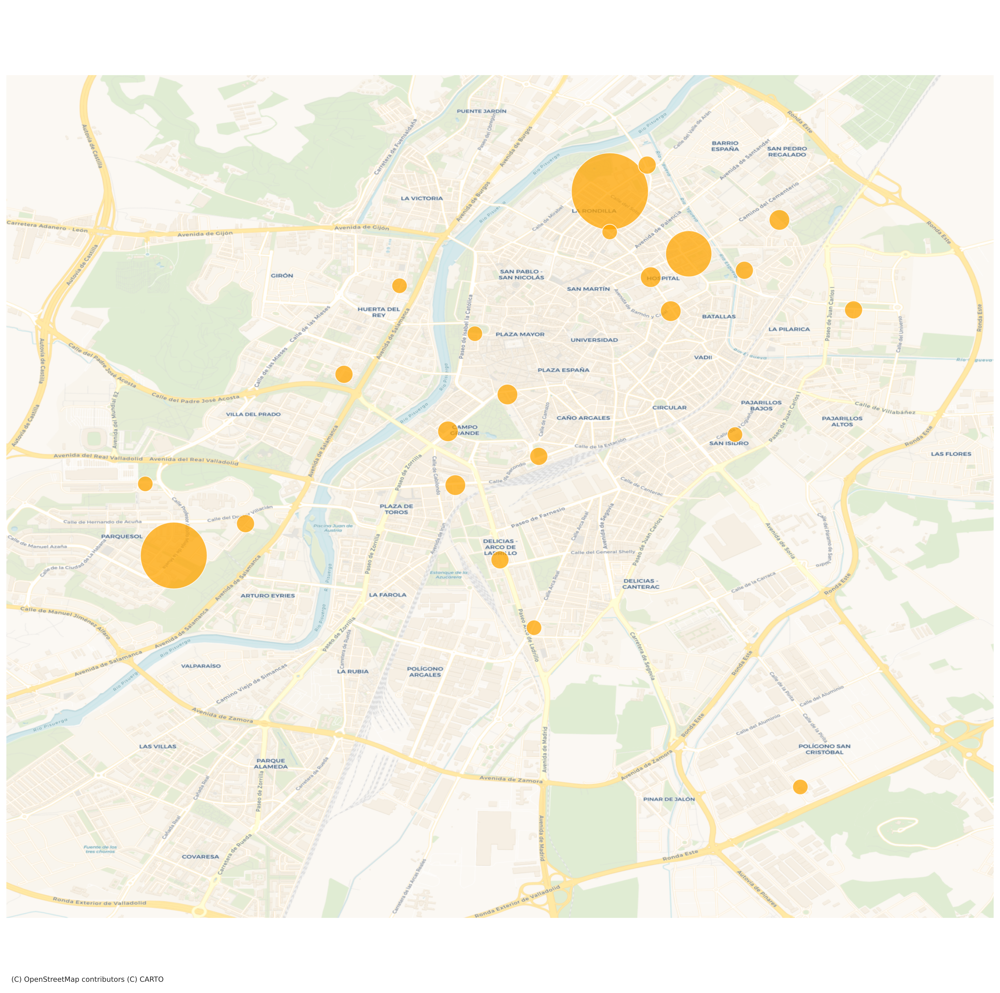

In [40]:
import matplotlib
matplotlib.rcParams['savefig.dpi'] = 300
matplotlib.rcParams["figure.dpi"] = 300
ax = gdf.plot(figsize=(20, 20), color="orange", alpha=0.75)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Voyager, zoom=15)
ax.set_axis_off()
plt.axis('equal')
plt.savefig("BikiRewind.png")
plt.show()